# 🔴 RetroPGF3 Anonymized Voting Analysis 

Data available here:
<br>https://github.com/ethereum-optimism/op-analytics/blob/main/rpgf/rpgf3/results/anonymized_project_votes.csv

In [1]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import warnings
matplotlib.rcParams.update({'text.usetex': False, 'font.family': 'Arial'})
warnings.filterwarnings("ignore")

RED = '#FF0420'
CMAP = 'bwr'

# Part 1. Prep and do some variance analysis on the data

In [2]:
# load a local copy of the data
df_projects = pd.read_csv("../data/anonymized_project_votes.csv")

# shorten name and remove special characters
def clean_name(string):
    string = "".join([s for s in string if s.isalnum() or s.isspace()])
    string = string.replace("  "," ")
    string = string.replace("Department of Decentralization", "Dept of Decentral")
    if len(string) > 20:
        string = " ".join(string[:15].split(" ")[:-1])
    string = string.strip("")
    return string
df_projects['project_name'] = df_projects['project_name'].apply(clean_name)

# turn the vote amounts into a list of values
df_projects['amount'] = df_projects['amount'].apply(eval)

# run some basic stats analysis
df_projects['mean'] = round(df_projects['amount'].apply(lambda amt: np.mean(amt)))
df_projects['std'] = round(df_projects['amount'].apply(lambda amt: np.std(amt)))
df_projects['median'] = round(df_projects['amount'].apply(lambda amt: np.median([x for x in amt if x])))
df_projects['median_w_zeroes'] = round(df_projects['amount'].apply(lambda amt: np.median(amt)))
df_projects['max'] = df_projects['amount'].apply(lambda amt: max(amt))

df_projects['max_to_median'] = df_projects['max'] / df_projects['median']
df_projects['coeff_variance'] = df_projects['std'] / df_projects['mean']
df_projects['zeroes'] = df_projects['amount'].apply(lambda amt: len([x for x in amt if not x]))
df_projects['zero_impact'] = df_projects['median'] - df_projects['median_w_zeroes']
df_projects['500Ks'] = df_projects['amount'].apply(lambda amt: len([x for x in amt if x >= 500_000]))
df_projects['5Ms'] = df_projects['amount'].apply(lambda amt: len([x for x in amt if x == 5_000_000]))

# count num votes more than 2 std deviations to the right
df_projects['outliers'] = df_projects.apply(lambda row: len([x for x in row['amount'] if row['std'] and (x-row['mean'])/row['std'] > 2]), axis=1)

# simple metric to measure how divisive a project might be
df_projects['divisive_score'] = np.sqrt(df_projects['zeroes']) * np.sqrt(df_projects['outliers'])

df_projects.head(1)

,project_name,amount,number_of_votes,mean,std,median,median_w_zeroes,max,max_to_median,coeff_variance,zeroes,zero_impact,500Ks,5Ms,outliers,divisive_score
0,0xDeFiTH,"[100000.0, 1700.0, 0.0, 5000.0, 0.0, 2000.0, 4...",23,11852.0,19858.0,10000.0,8900.0,100000.0,10.0,1.675498,2,1100.0,0,0,1,1.414214


## High level voting stats

In [3]:
df_projects[['number_of_votes', 'zeroes', '5Ms']].sum()

number_of_votes    21813
zeroes               788
5Ms                   61
dtype: int64

## Histogram of votes by OP amount

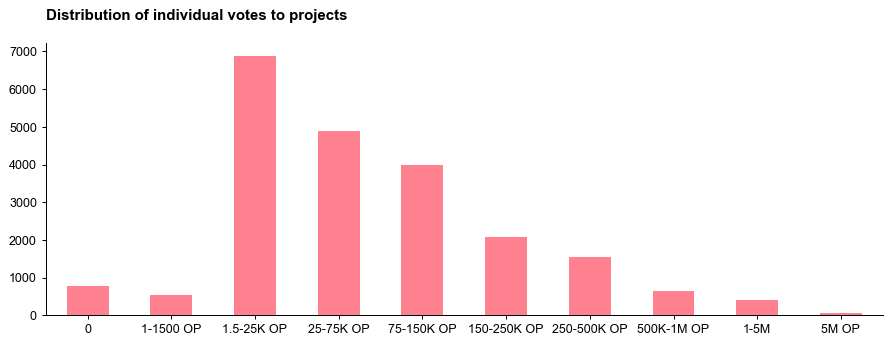

In [4]:
fig, ax = plt.subplots(figsize=(12,4), dpi=90, facecolor='WHITE')
(
    pd.cut(
        pd.Series([x for amts in df_projects['amount'] for x in amts]), 
        bins=[-np.inf, 0, 1500, 25_000, 75_000, 150_000, 
              250_000, 500_000, 1_000_000, 4_999_999, np.inf],
        labels=["0", "1-1500 OP", "1.5-25K OP", "25-75K OP", "75-150K OP", "150-250K OP", 
                "250-500K OP", "500K-1M OP", "1-5M", "5M OP"]
    )
    .value_counts()
    .sort_index()
    .plot(
        kind='bar', 
        color=RED, 
        alpha=.5,
        ax=ax
    )
)
plt.xticks(rotation=0)
ax.set_title("Distribution of individual votes to projects\n", loc='left', weight='bold')
sns.despine()

## Arrive at a final project dataframe

In [5]:
# remove projects that failed to make quorum
df_projects = df_projects[df_projects['number_of_votes'] >= 17]

# Part 2. Categorize projects based on popularity and variance

In [6]:
VOTE_THRESH = df_projects['number_of_votes'].median()
VAR_THRESH = df_projects['coeff_variance'].median()
print(VOTE_THRESH, VAR_THRESH)

36.0 1.350979861388984


## Visualize categories as a 2x2

Text(0.0, 1.0, 'Distribution of projects by popularity and variance\n')

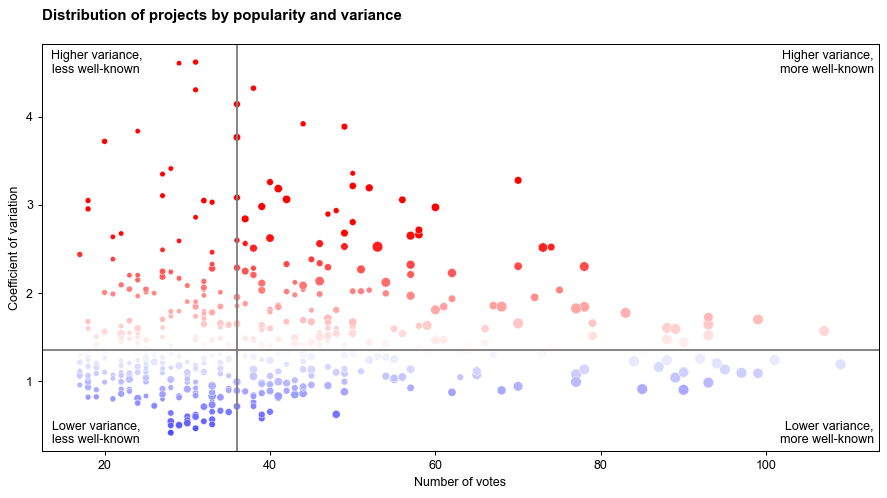

In [7]:
fig, ax = plt.subplots(figsize=(12,6), dpi=90, facecolor="white")
(
    sns.scatterplot(
        data=df_projects, 
        x='number_of_votes', 
        y='coeff_variance', 
        size='median', 
        hue='coeff_variance', 
        hue_norm=(0,VAR_THRESH*2), 
        palette=CMAP, 
        size_norm=(10_000,200_000), 
        legend=False)
)
ax.axhline(VAR_THRESH, color='gray')
ax.axvline(VOTE_THRESH, color='gray')
ax.set_ylabel("Coefficient of variation")
ax.set_xlabel("Number of votes")

ax.text(s='Higher variance,\nless well-known', x=19, y=4.5, ha='center')
ax.text(s='Lower variance,\nless well-known', x=19, y=.3, ha='center')
ax.text(s='Lower variance,\nmore well-known', x=113, y=.3, ha='right')
ax.text(s='Higher variance,\nmore well-known', x=113, y=4.5, ha='right')

ax.set_title("Distribution of projects by popularity and variance\n", loc='left', weight='bold')

## Assign a category to each project

In [8]:
def categorize(votes, coeff):
    if coeff < VAR_THRESH:
        type_ = "Lower variance"
    else:
        type_ = "Higher variance"
    if votes < VOTE_THRESH:
        type_ += ", less well-known"
    else:
        type_ += ", more well-known"
    return type_
        
df_projects['category'] = df_projects.apply(lambda x: categorize(x['number_of_votes'], x['coeff_variance']), axis=1)
df_projects['category'].value_counts()

category
Higher variance, more well-known    146
Lower variance, less well-known     144
Lower variance, more well-known     107
Higher variance, less well-known    105
Name: count, dtype: int64

## Visualize medians by category

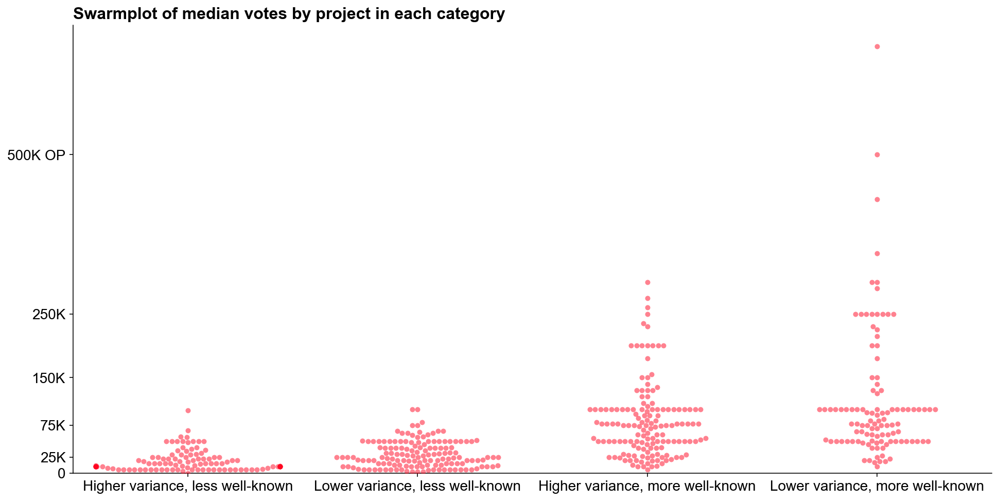

In [9]:
fig, ax = plt.subplots(figsize=(16,8), facecolor='white', dpi=144)
sns.swarmplot(
    data=df_projects,#df_projects[df_projects['category'].str.contains("less")==True],
    x='category',
    y='median_w_zeroes',
    color=RED,
    alpha=.5,
    size=5,
    dodge=True,
)
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_yticks([0, 25_000, 75_000, 150_000, 250_000, 500_000])
ax.set_yticklabels(["0", "25K", "75K", "150K", "250K", "500K OP"], fontsize=14)
plt.xticks(fontsize=14)
ax.set_ylim(0,)
ax.set_title("Swarmplot of median votes by project in each category", loc='left', fontsize=16, weight='bold')
sns.despine()

## Create a 5th category for "divisive" projects

In [10]:
divisive_filter = (
    (df_projects['divisive_score']>0) 
    & (df_projects['zeroes']>1) 
    & (df_projects['500Ks']>1)
)
df_projects.loc[divisive_filter, 'category'] = 'Divisive'
df_projects['category'].value_counts()

category
Lower variance, less well-known     144
Higher variance, more well-known    124
Higher variance, less well-known    105
Lower variance, more well-known      96
Divisive                             33
Name: count, dtype: int64

## Unstack the voting data

In [11]:
votes = []
for _, row in df_projects.iterrows():
    amounts = row['amount']
    n = row['project_name']
    c = row['category']
    for a in amounts:
        votes.append((n, min(max(a,.1),500_000), c))
df_votes = pd.DataFrame(votes, columns=['project', 'vote', 'category'])
df_votes.head(1)

,project,vote,category
0,0xDeFiTH,100000.0,"Higher variance, less well-known"


## Make a pretty plot for illustrating vote distributions by category

In [12]:
# make a pretty plot ;)
def stripplot(category, sort_by='name'):
    
    dff = df_votes[df_votes['category'] == category].copy()
    n = len(dff['project'].unique())
    
    if sort_by != 'name':
        rank = df_projects.set_index('project_name')[sort_by].rank().to_dict()
        dff['rank'] = dff['project'].apply(lambda x: rank.get(x))
#        print(dff.head())
        dff.sort_values(by='rank', ascending=False, inplace=True)        
    
    fig, ax = plt.subplots(figsize=(5,n/5), dpi=200, facecolor='white')
    sns.stripplot(
        dff, 
        y='project', 
        x='vote', 
        hue='vote', 
        palette='coolwarm',
        hue_norm=(0,200_000),
        orient='h', 
        alpha=.5, 
        linewidth=0,
        legend=False,
        dodge=0
    )
    ax.set_xlim(-20_000,520_000)

    for lbl in ax.get_yticklabels():
        p = lbl.get_text()
        y = lbl.get_position()[1]
        right = len(dff[(dff['project']==p) & (dff['vote']==500_000)])
        if right:
            ax.text(s=right, x=510_000, y=y, ha='left', va='center', fontsize=6)
        left = len(dff[(dff['project']==p) & (dff['vote']==0.1)])
        if left:
            ax.text(s=left, x=-10_000, y=y, ha='right', va='center', fontsize=6)

    ax.grid(color='grey', linestyle='--', linewidth=.5)        
    ax.spines[['right', 'top', 'left', 'bottom']].set_visible(False)
    ax.tick_params(direction='out', length=0, width=.5, grid_alpha=0.5)
    
    title = f"Distribution of {len(dff):,} votes across {n} '{category.lower()}' projects\n"
    ax.set_title(title, loc='left', fontsize=8, weight='bold')
    ax.set_xlabel("")
    ax.set_xticks([0, 25_000, 75_000, 150_000, 250_000, 500_000])
    ax.set_xticklabels(["0", "25K", "75K", "150K", "250K", "500K+"], fontsize=8)
    plt.yticks(fontsize=8)
    ax.set_ylabel("")

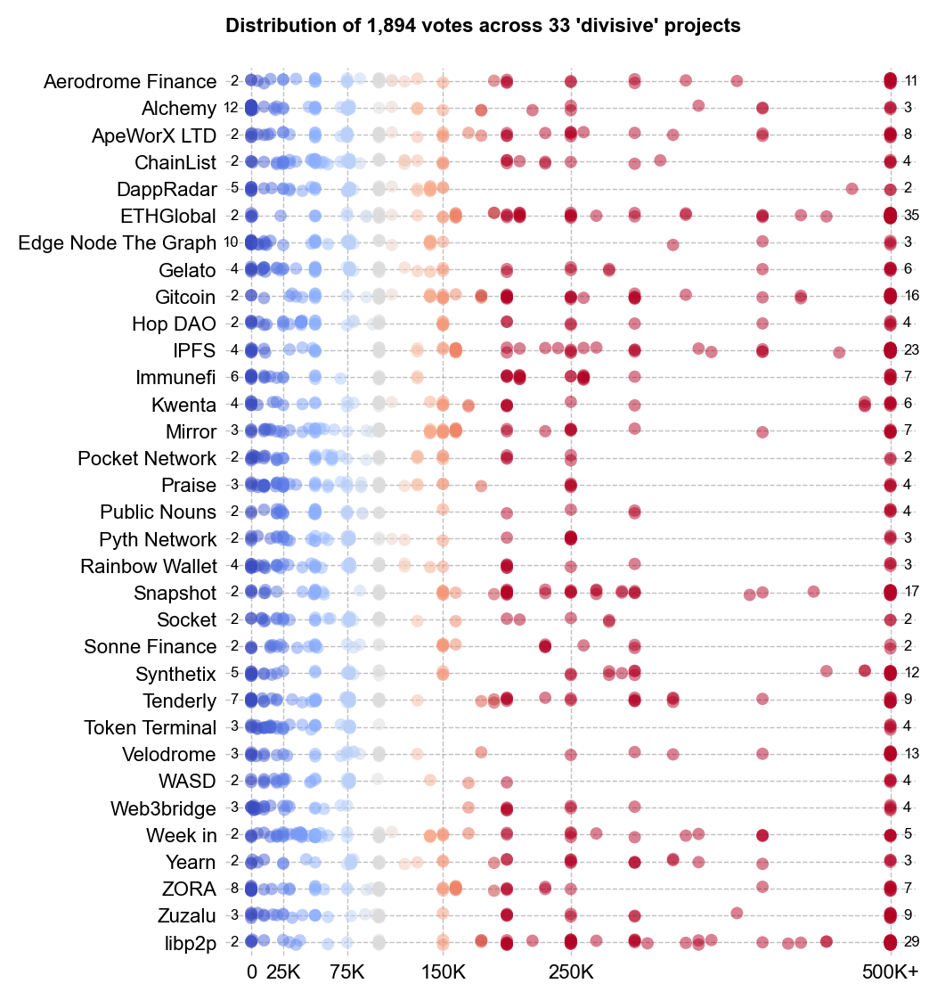

In [13]:
stripplot("Divisive")

# Part 3. Assess impact of zero votes on projects

In [14]:
# zeroes impact
(
    df_projects
    .sort_values(by='zeroes', ascending=False)
    .head(11)
    [['project_name', 'number_of_votes', 'zeroes', 'median', 'median_w_zeroes', 'zero_impact']]
    .set_index('project_name', drop=True)
    .applymap(int)
)

,number_of_votes,zeroes,median,median_w_zeroes,zero_impact
project_name,,,,,
NFTEarth,20,12,27500,0,27500
Alchemy,59,12,77000,75000,2000
Edge Node The Graph,58,10,77000,67500,9500
Messari,39,8,50000,25000,25000
ZORA,59,8,150000,100000,50000
Bankless DAO,47,8,25000,24000,1000
Tenderly,74,7,100000,77000,23000
Nacion Bankless,40,6,15000,5000,10000
Synapse Labs,29,6,75000,25000,50000


In [15]:
# most zeroed
(
    df_projects
    .sort_values(by='zeroes', ascending=False)
    .head(15)
    [['project_name', 'zeroes', 'number_of_votes']]
    .set_index('project_name')
)

,zeroes,number_of_votes
project_name,,
NFTEarth,12,20
Alchemy,12,59
Edge Node The Graph,10,58
Messari,8,39
ZORA,8,59
Bankless DAO,8,47
Tenderly,7,74
Nacion Bankless,6,40
Synapse Labs,6,29


## Illustrate impact on a single project

In [16]:
def barchart(lst, title):
    fig, ax = plt.subplots(figsize=(10,2), dpi=144, facecolor='white')
    series = pd.Series(lst).sort_values(ascending=False) / 1000
    series.plot(kind='bar', color=RED, alpha=.5, ax=ax, width=1)
    ax.set_xlim(0,len(series))
    ax.set_xticks([])
    ax.set_ylim(0,500)
    ax.set_yticks([0,100,200,300,400,500])
    ax.set_yticklabels([0,100,200,300,400,"500K+"])
    
    med = series.median()
    ax.axhline(med, color='grey', linestyle='--', lw=1)
    ax.text(s=f"Median: {med:.0f}K OP", x=len(series), y=series.median(), va='bottom', ha='right')    
    ax.set_title(f"{title}\n", loc='left', weight='bold')
    sns.despine()

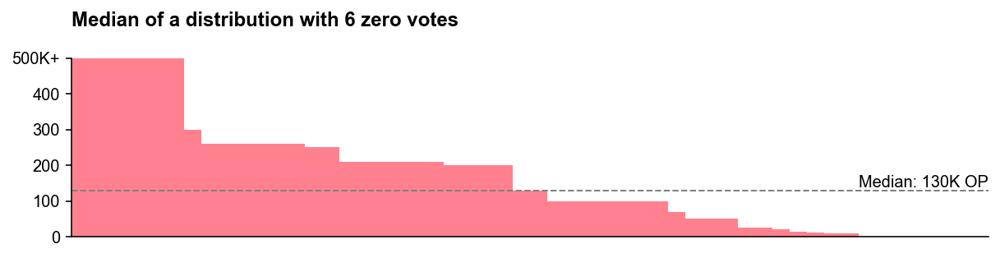

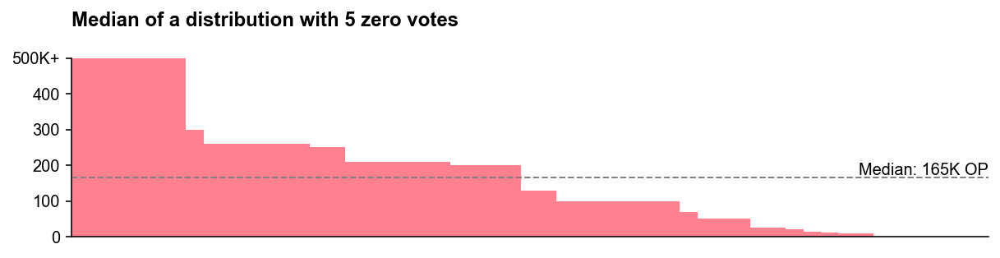

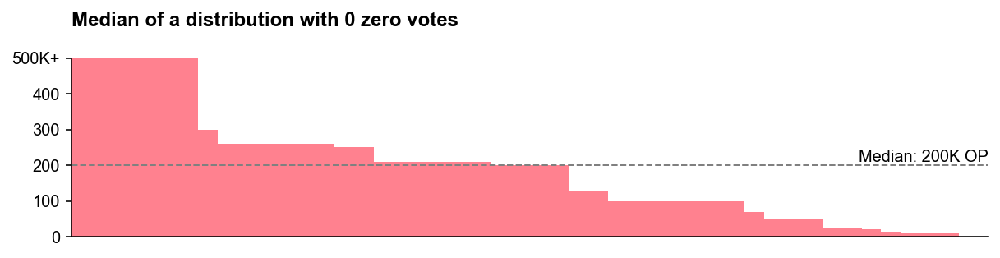

In [17]:
sample_zeroes = sorted(list(df_projects[df_projects['project_name'] == 'Immunefi']['amount'])[0])

num_zeroes = 7
for z in [0,1,6]:
    barchart(sample_zeroes[z:], f"Median of a distribution with {num_zeroes-(z+1)} zero votes")

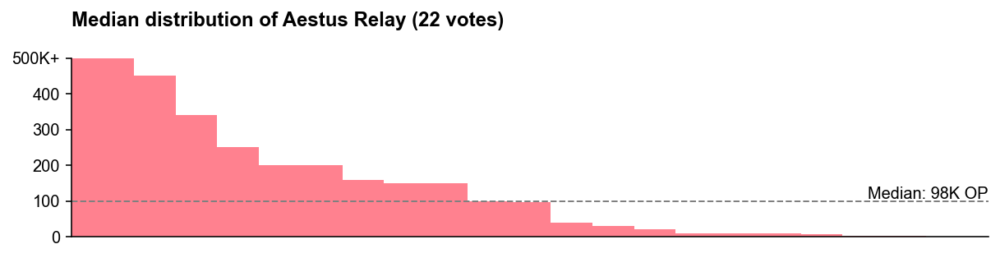

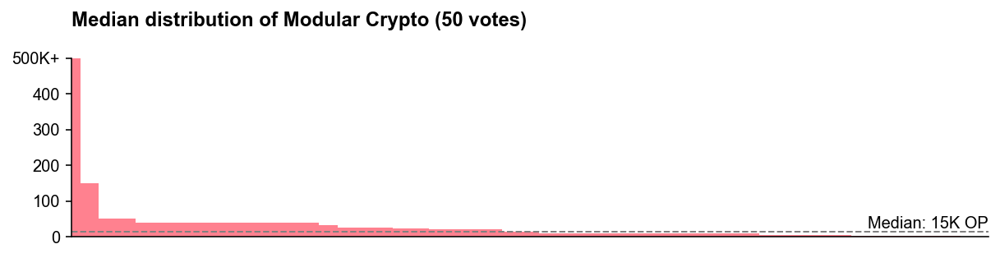

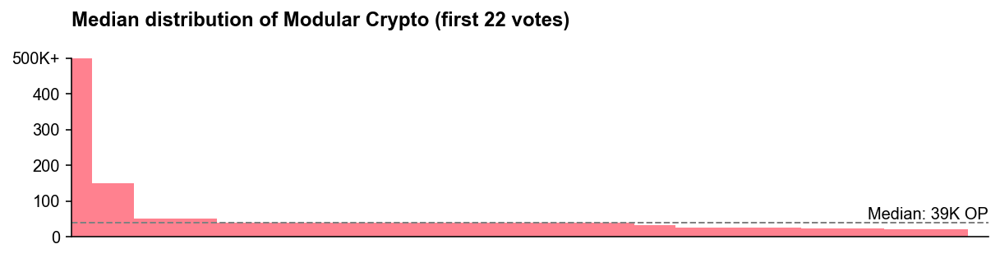

In [18]:
barchart(df_projects.loc[17, 'amount'], 'Median distribution of Aestus Relay (22 votes)')
barchart(df_projects.loc[324, 'amount'], 'Median distribution of Modular Crypto (50 votes)')
barchart(sorted(df_projects.loc[324, 'amount'])[-22:], 'Median distribution of Modular Crypto (first 22 votes)')

Text(0.0, 1.0, "Incremental impact of a zero vote on a project's median token amount")

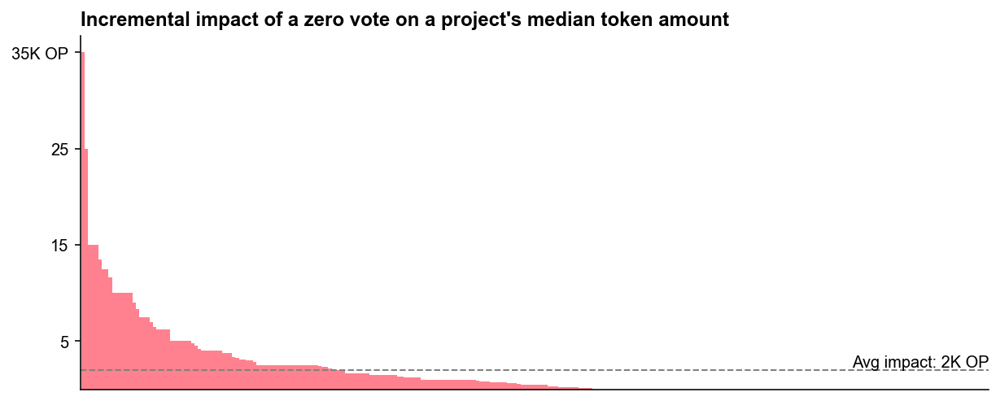

In [19]:
fig, ax = plt.subplots(figsize=(10,4), dpi=144, facecolor='white')
zero_impact = (
    (df_projects[df_projects['zeroes']>0]['zero_impact'] 
    / df_projects[df_projects['zeroes']>0]['zeroes'])
    .sort_values(ascending=False)
    / 1000
)
zero_impact.plot(kind='bar', color=RED, alpha=.5, ax=ax, width=1)
ax.set_xticks([])
ax.set_yticks([5,15,25,35])
ax.set_yticklabels([5,15,25,"35K OP"])
ax.axhline(zero_impact.mean(), color='grey', linestyle='--', lw=1)
avg_impact = zero_impact.mean()
ax.text(s=f"Avg impact: {avg_impact:,.0f}K OP", x=len(zero_impact), y=avg_impact, va='bottom', ha='right')
sns.despine()
ax.set_title("Incremental impact of a zero vote on a project's median token amount", loc='left', weight='bold')

## Identify projects most affected by zeroes

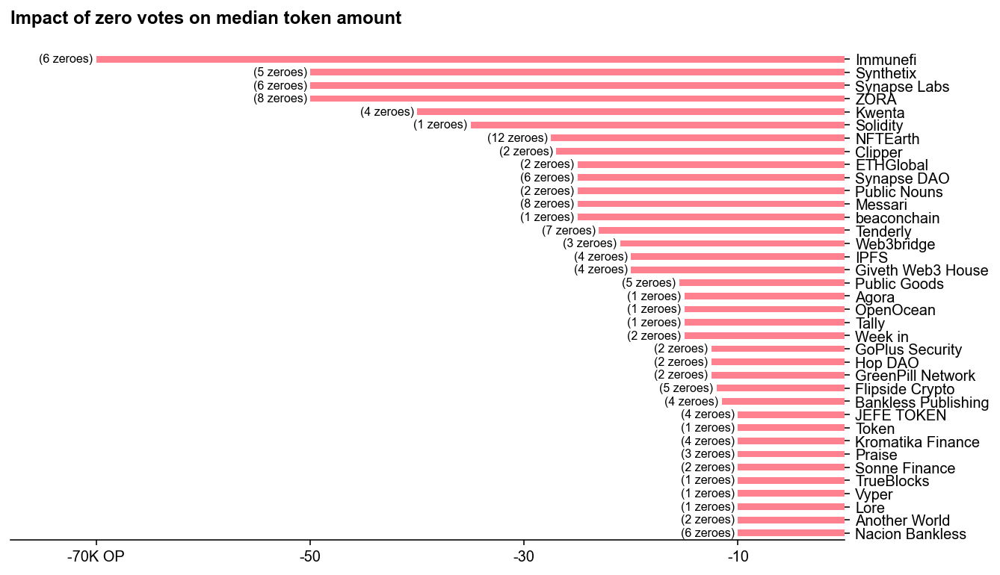

In [20]:
fig, ax = plt.subplots(figsize=(10,6), dpi=144, facecolor='white')
zer0 = (
    -df_projects[df_projects['zero_impact']>=10000]
    .set_index('project_name')
    ['zero_impact'] 
    .sort_values() / 1000
)
zer0.plot(kind='barh', ax=ax, color=RED, alpha=.5)
for lbl in ax.get_yticklabels():
    
    p = lbl.get_text()
    x = zer0[p]
    y = lbl.get_position()[1]
    num = df_projects[df_projects['project_name']==p]['zeroes'].max()
    txt = f"({num} zeroes) "
    ax.text(s=txt, x=x, y=y, ha='right', va='center', fontsize=8)

ax.set_title("Impact of zero votes on median token amount\n", loc='left', weight='bold')    
ax.set_ylabel("")
ax.spines[['right', 'top', 'left']].set_visible(False)
ax.set_xlim(-78,0)
ax.set_xticks([-70,-50,-30,-10])
ax.set_xticklabels(["-70K OP",-50,-30,-10])
ax.yaxis.tick_right()

# Appendix: make some more pretty plots

In [21]:
CATS = list(df_projects['category'].unique())

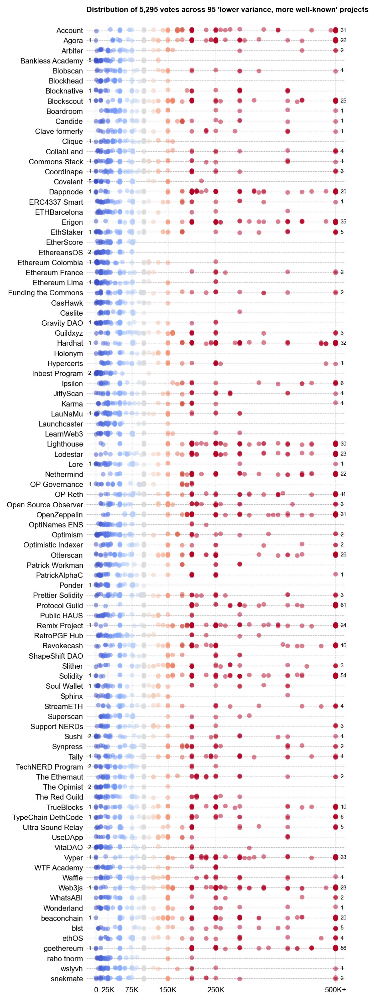

In [22]:
stripplot(CATS[3])

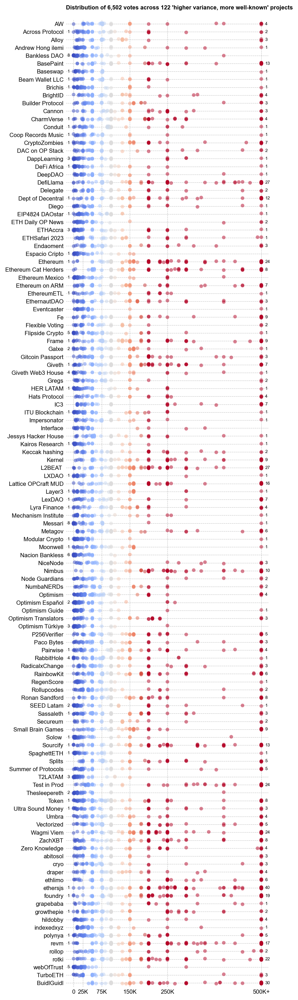

In [23]:
stripplot(CATS[2])

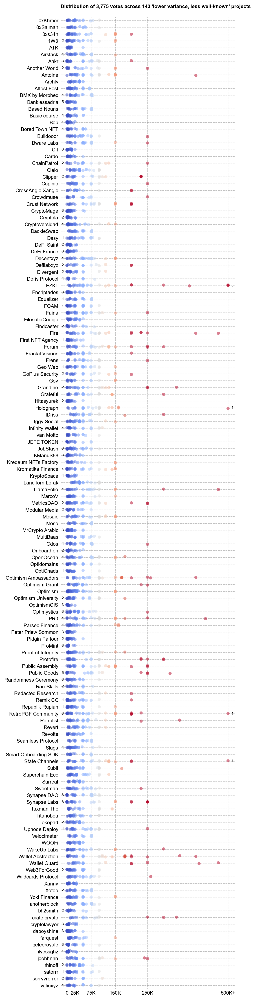

In [24]:
stripplot(CATS[1])

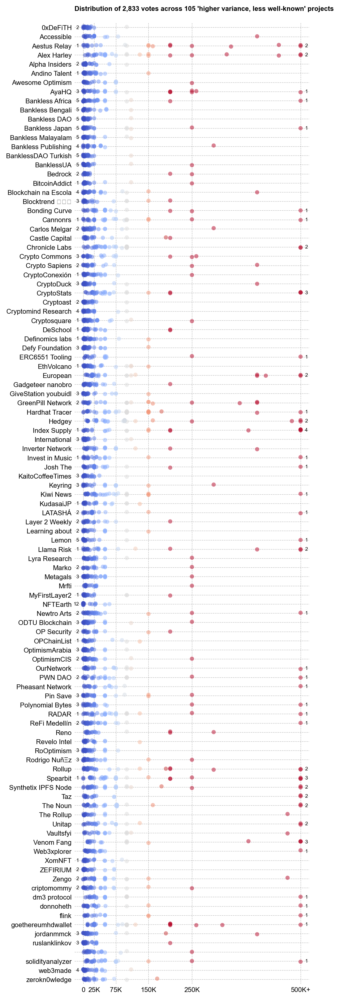

In [25]:
stripplot(CATS[0])

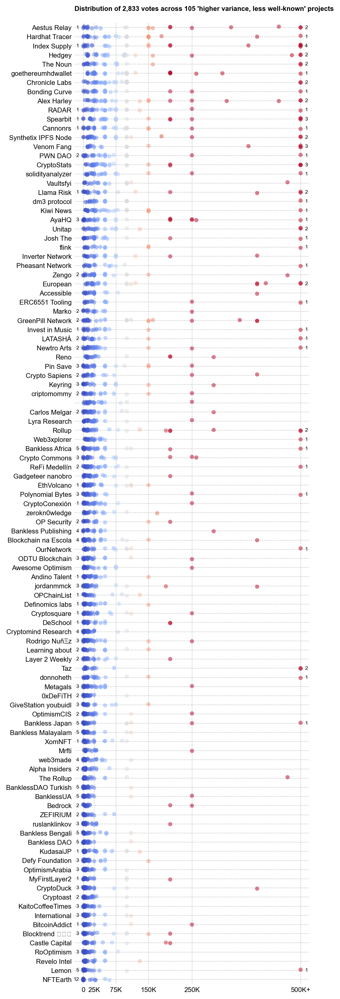

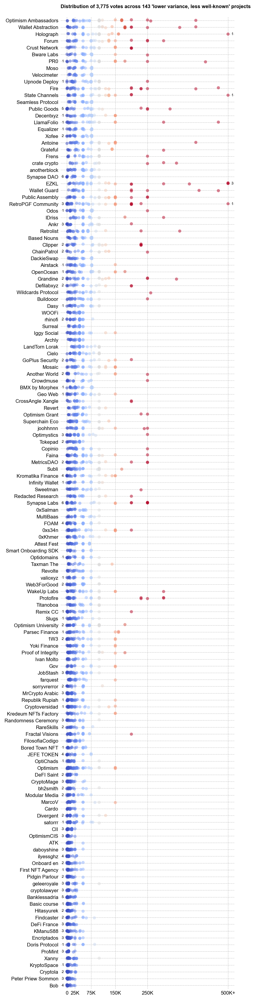

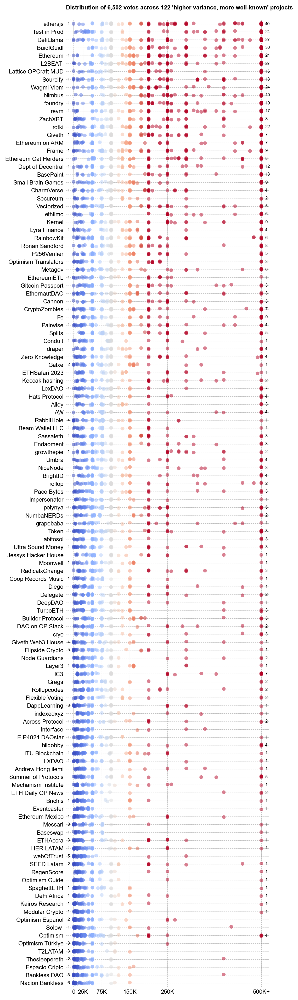

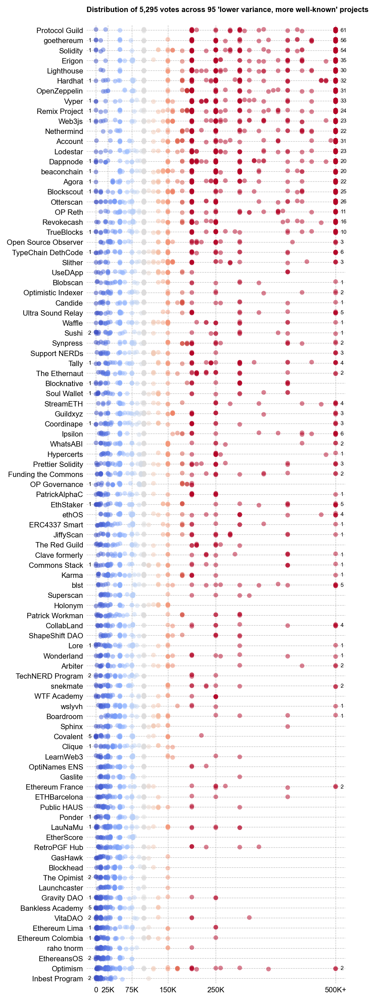

In [26]:
for i in range(0,4):
    stripplot(CATS[i], sort_by='median_w_zeroes')

# Appendix 2: Diff on growthepie.xyz data

In [27]:
gtp = pd.read_csv("../../../../community/datasets/retropgf3_results/csv/RetroPGF3 Results - ConsolidatedData.csv")
gtp.head()

,Project ID,Result: # Ballots,Result: Median OP,Result: Quorum Reached,Result: Received OP,Meta: Project Name,Meta: Applicant Type,Meta: Website,Meta: Bio,Meta: Payout Address,...,OSO: Total Txn Fees (ETH),OSO: Txn Fees Last 6 Months (ETH),OSO: # NPM Packages,OSO: Date First Download,OSO: Total Downloads,OSO: Downloads Last 6 Months,OSO: Has Profile,GTP: VC Funding Amount,GTP: Has Token,GTP: Has VC Funding
0,0x2a1d784639add63bb313c3836b5dc1421d0a775d4cf7...,95,668000.0,True,663853.62,Protocol Guild,PROJECT,https://protocol-guild.readthedocs.io,A collective of Ethereum's active core protoco...,0x728D29E9E06cE5d846242692dF05467076c19849,...,NaN,NaN,0.0,NaN,NaN,NaN,1,NaN,NaN,0
1,0x5b5cb12df644ca17fabd91825886b5491d1526befaec...,101,500000.0,True,496896.42,go-ethereum,PROJECT,https://github.com/ethereum/go-ethereum,An Ethereum execution layer client,0x0000006916a87b82333f4245046623b23794C65C,...,NaN,NaN,0.0,NaN,NaN,NaN,1,NaN,NaN,0
2,0xef65b1e277e1c7398bbd8a10c623d53dbbb64474ea68...,109,425000.0,True,422361.96,Solidity,PROJECT,https://soliditylang.org/,Solidity is a statically-typed curly-braces pr...,0xF0F1eF973C7Ae51Ef7ae917812932569100956ae,...,NaN,NaN,0.0,NaN,NaN,NaN,1,NaN,NaN,0
3,0x75c17ab86592588357ebe8f116dab73c6a531ec20a5b...,92,341666.5,True,339545.72,Erigon,PROJECT,https://erigon.ch/,Ethereum implementation on the efficiency fron...,0x9D20893054afC4A74b856089c44F9A09d1C38Db0,...,NaN,NaN,0.0,NaN,NaN,NaN,1,NaN,NaN,0
4,0x32ee121e0dbcef2fe2b7a8e668f9a53ddc6d43e16c42...,107,300000.0,True,298137.85,ethers.js,PROJECT,https://ethers.org,"Ethers.js is a simple, compact and complete li...",0x8ba1f109551bD432803012645Ac136ddd64DBA72,...,NaN,NaN,1.0,2017-04-05,115250426.0,27880694.0,1,NaN,NaN,0


In [80]:
df_projects.loc[173, 'project_name'] = 'Edge & Node / The Graph'
df_projects.loc[462, 'project_name'] = 'Sonne Finance '
df_projects.loc[465, 'project_name'] = 'Socket '
df_projects.loc[556, 'project_name'] = 'Week in Ethereum News'

df_projects[df_projects['category'] == 'Divisive']

,project_name,amount,number_of_votes,mean,std,median,median_w_zeroes,max,max_to_median,coeff_variance,zeroes,zero_impact,500Ks,5Ms,outliers,divisive_score,category
16,Aerodrome Finance,"[100000.0, 100000.0, 25000.0, 25000.0, 50000.0...",51,428627.0,971677.0,110000.0,110000.0,5000000.0,45.454545,2.266952,2,0.0,11,2,2,2.000000,Divisive
20,Alchemy,"[100.0, 77000.0, 1900.0, 50000.0, 75000.0, 770...",59,102256.0,136083.0,77000.0,75000.0,580000.0,7.532468,1.330807,12,2000.0,3,0,5,7.745967,Divisive
29,ApeWorX LTD,"[200000.0, 150000.0, 0.0, 250000.0, 170000.0, ...",63,219502.0,295065.0,100000.0,100000.0,1300000.0,13.000000,1.344247,2,0.0,8,0,5,3.162278,Divisive
91,ChainList,"[30000.0, 35000.0, 50000.0, 77000.0, 100000.0,...",67,124269.0,161193.0,77000.0,77000.0,1000000.0,12.987013,1.297130,2,0.0,4,0,4,2.828427,Divisive
133,DappRadar,"[10000.0, 80000.0, 25000.0, 140000.0, 100000.0...",54,99094.0,104570.0,80000.0,77000.0,500000.0,6.250000,1.055261,5,3000.0,2,0,3,3.872983,Divisive
169,ETHGlobal,"[210000.0, 250000.0, 23000.0, 1000000.0, 25000...",90,615601.0,886849.0,285000.0,260000.0,5000000.0,17.543860,1.440623,2,25000.0,35,2,5,3.162278,Divisive
173,Edge & Node / The Graph,"[400000.0, 0.0, 77000.0, 60000.0, 75000.0, 0.0...",58,89519.0,120973.0,77000.0,67500.0,500000.0,6.493506,1.351367,10,9500.0,3,0,4,6.324555,Divisive
217,Gelato,"[77000.0, 77000.0, 50000.0, 0.0, 20000.0, 8600...",64,134902.0,180340.0,77000.0,77000.0,1000000.0,12.987013,1.336822,4,0.0,6,0,6,4.898979,Divisive
219,Gitcoin,"[100000.0, 340000.0, 2500000.0, 30000.0, 15000...",78,369897.0,681176.0,180000.0,180000.0,5000000.0,27.777778,1.841529,2,0.0,16,1,4,2.828427,Divisive
242,Hop DAO,"[1000000.0, 39000.0, 100.0, 50000.0, 25000.0, ...",50,219082.0,703931.0,62500.0,50000.0,5000000.0,80.000000,3.213094,2,12500.0,4,1,1,1.414214,Divisive


In [81]:
divisive_names = df_projects[df_projects['category'] == 'Divisive']['project_name'].to_list()
len(divisive_names)

33

In [82]:
found_names = gtp[gtp['Meta: Project Name'].isin(divisive_names)]['Meta: Project Name'].to_list()
len(found_names)

33

In [86]:
ddf = (
    df_projects[df_projects['project_name'].isin(divisive_names)]
    .set_index('project_name')
    .join(
        gtp[gtp['Meta: Project Name'].isin(divisive_names)]
        [['Meta: Project Name', 'GTP: Has Token', 'GTP: Has VC Funding']]
        .set_index('Meta: Project Name')
    )
    [['median_w_zeroes', 'number_of_votes', 'zeroes', 'GTP: Has Token', 'GTP: Has VC Funding']]
)
ddf['GTP: Has Token'].fillna(False, inplace=True)
ddf['GTP: Has VC Funding'] = ddf['GTP: Has VC Funding'].apply(lambda x: x == 1)

ddf.columns = ['Median OP', '# Votes', '# Zero Votes', 'Has Token?', 'Has VC Funding?']

ddf['Has Token or VC?'] = ddf['Has Token?'] | ddf['Has VC Funding?']

ddf.sort_values(by=['Has Token or VC?', '# Zero Votes'], ascending=False)

,Median OP,# Votes,# Zero Votes,Has Token?,Has VC Funding?,Has Token or VC?
project_name,,,,,,
Alchemy,75000.0,59,12,False,True,True
Edge & Node / The Graph,67500.0,58,10,True,True,True
ZORA,100000.0,59,8,False,True,True
Tenderly,77000.0,74,7,False,True,True
Immunefi,130000.0,53,6,False,True,True
DappRadar,77000.0,54,5,False,True,True
Synthetix,100000.0,54,5,True,True,True
Gelato,77000.0,64,4,True,True,True
Kwenta,105000.0,46,4,True,True,True


In [76]:
len(ddf)

29